In [3]:
import pandas as pd
from matplotlib import pyplot as plt 
import seaborn as sns
import numpy as np
from src.utils import save_figure

In [4]:
edgeR_results = pd.read_csv("/root/capsule/data/20260716_edgeR_CPS_AT8_results/seaad_cah_cps_at8_de_results.csv")

<Axes: xlabel='count', ylabel='cell_type'>

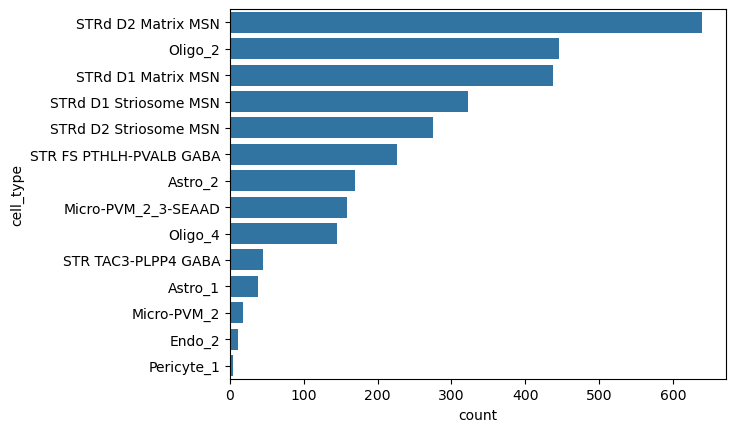

In [5]:
sns.barplot(edgeR_results[edgeR_results["FDR"] < 0.05]['cell_type'].value_counts(), orient = "h")

In [6]:
nebula_results = pd.read_csv("/root/capsule/data/DEG_Supplemental_Tables/Supplemental Table 5.csv", index_col = 0)

<Axes: xlabel='count', ylabel='cell_type'>

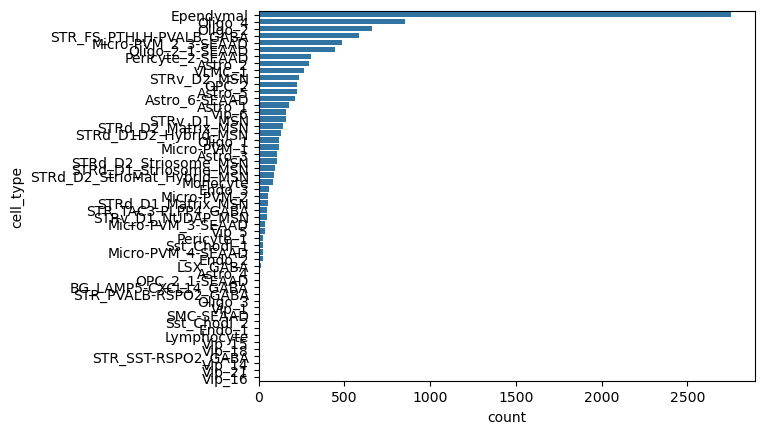

In [7]:
sns.barplot(nebula_results[nebula_results["fdr_p_CPS_AT8"] < 0.1]['cell_type'].value_counts(), orient = "h")

In [8]:
edgeR_results[(edgeR_results['gene'].isin(["GIPC1", "RAP1A", "FLT1", "S1PR1"])) & (edgeR_results['cell_type'] == "Micro-PVM_2_3-SEAAD")]

,cell_type,engine,gene,logFC,logCPM,F,PValue,FDR
68798,Micro-PVM_2_3-SEAAD,QLF,GIPC1,-1.257292,4.672465,13.786603,0.000418,0.044612
68884,Micro-PVM_2_3-SEAAD,QLF,FLT1,3.397984,5.441817,11.837831,0.000992,0.061946
68926,Micro-PVM_2_3-SEAAD,QLF,RAP1A,0.658323,8.848652,11.283485,0.001308,0.067532


In [9]:
nebula_results = pd.read_csv("/root/capsule/data/DEG_Supplemental_Tables/Supplemental Table 5.csv", index_col = 0)

In [10]:
edgeR_results['cell_type'] = edgeR_results['cell_type'].str.replace(" ", "_")

In [11]:
edgeR_results.index = edgeR_results['cell_type']+ "_" + edgeR_results['gene']

In [12]:
comparison_df = edgeR_results[["cell_type", "gene", "logFC", "FDR"]].rename(columns = {"logFC":r"$\beta_{edgeR}$", "FDR":r"$FDR_{edgeR}$"})


In [13]:
comparison_df[["$FDR_{nebula}$", r"$\beta_{nebula}$"]] = nebula_results[["fdr_p_CPS_AT8", "logFC_CPS_AT8"]]

In [14]:
from scipy.stats import false_discovery_control

In [15]:
(false_discovery_control(edgeR_results[edgeR_results["cell_type"] == "Micro-PVM_2_3-SEAAD"]["PValue"]) < 0.1).sum()

np.int64(438)

In [16]:
comparison_df[[r"$\beta_{edgeR}$", r"$\beta_{nebula}$", "cell_type"]].groupby("cell_type").corr()[r"$\beta_{edgeR}$"]

cell_type                                
Astro_1                  $\beta_{edgeR}$     1.000000
                         $\beta_{nebula}$    0.919517
Astro_2                  $\beta_{edgeR}$     1.000000
                         $\beta_{nebula}$    0.917152
Endo_2                   $\beta_{edgeR}$     1.000000
                         $\beta_{nebula}$    0.927938
Micro-PVM_2              $\beta_{edgeR}$     1.000000
                         $\beta_{nebula}$    0.932780
Micro-PVM_2_3-SEAAD      $\beta_{edgeR}$     1.000000
                         $\beta_{nebula}$    0.949825
Oligo_2                  $\beta_{edgeR}$     1.000000
                         $\beta_{nebula}$    0.950480
Oligo_4                  $\beta_{edgeR}$     1.000000
                         $\beta_{nebula}$    0.961966
Pericyte_1               $\beta_{edgeR}$     1.000000
                         $\beta_{nebula}$    0.913254
STR_FS_PTHLH-PVALB_GABA  $\beta_{edgeR}$     1.000000
                         $\beta_{nebula}

In [19]:
comparison_df['cell_type'] = comparison_df['cell_type'].str.replace("MSN", "SPN")

In [20]:
from scipy.stats import pearsonr
def scatter_with_corr(x, y, **kwargs):
    ax = plt.gca()
    mask = x.notna() & y.notna()
    x, y = x[mask], y[mask]

    sns.scatterplot(x=x, y=y, alpha=0.5, ax=ax)

    # pearson correlation
    r, p = pearsonr(x, y)
    ax.annotate(f'$R^2$ = {r**2:.2f}', xy=(0.05, 0.95), xycoords='axes fraction',
                ha='left', va='top', fontsize=11,
                bbox=dict(boxstyle='round', fc='white', alpha=0.8))

    # equal axes, forced to include the origin
    lo = min(x.min(), y.min(), 0)
    hi = max(x.max(), y.max(), 0)
    lims = [lo, hi]
    ax.set_xlim(lims)
    ax.set_ylim(lims)
    ax.set_aspect('equal', adjustable='box')

    # reference lines at the origin
    ax.axhline(0, color='gray', lw=0.8, alpha=0.5, zorder=0)
    ax.axvline(0, color='gray', lw=0.8, alpha=0.5, zorder=0)

    # diagonal reference line
    ax.plot(lims, lims, ls='--', color='red', alpha=0.5, zorder=0)


In [21]:
with plt.rc_context({"font.size": 12, "figure.figsize":(15, 7.5*1.414), 'figure.dpi':600}):
    g = sns.FacetGrid(comparison_df.dropna(), col = "cell_type", col_wrap = 4, sharex = False, sharey = False)
    g.map(scatter_with_corr, r"$\beta_{edgeR}$", r"$\beta_{nebula}$")
    g.set_titles("{col_name}")
    plt.tight_layout()
    plt.savefig("/scratch/SupplementalFigure_EdgeR_Comparison_Beta.png")

In [22]:
def scatter_with_corr(x, y, **kwargs):
    ax = plt.gca()
    mask = x.notna() & y.notna()
    x, y = x[mask], y[mask]

    sns.scatterplot(x=x, y=y, alpha=0.5, ax=ax)

    # pearson correlation
    r, p = pearsonr(x, y)
    ax.annotate(f'R = {r**2:.2f}', xy=(0.05, 0.95), xycoords='axes fraction',
                ha='left', va='top', fontsize=11,
                bbox=dict(boxstyle='round', fc='white', alpha=0.8))

    # set log scale
    ax.set_xscale("log")
    ax.set_yscale("log")

    # equal axes, forced to include the origin
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    lims = [min(xmin, ymin), max(xmax, ymax)]
    ax.set_xlim(lims)
    ax.set_ylim(lims)
    ax.set_aspect('equal', adjustable='box')

    # reference lines at the origin
    ax.axhline(0, color='gray', lw=0.8, alpha=0.5, zorder=0)
    ax.axvline(0, color='gray', lw=0.8, alpha=0.5, zorder=0)

    # diagonal reference line
    ax.plot(lims, lims, ls='--', color='red', alpha=0.5, zorder=0)


x = comparison_df[r"$FDR_{edgeR}$"]
y = comparison_df[r"$FDR_{nebula}$"]
with plt.rc_context({"font.size": 12, "figure.figsize":(15, 7.5*1.414), 'figure.dpi':600}):
    g = sns.FacetGrid(comparison_df.dropna(), col = "cell_type", col_wrap = 4, sharex = False, sharey = False)
    g.map(scatter_with_corr, r"$FDR_{edgeR}$", r"$FDR_{nebula}$")
    g.set_titles("{col_name}")
    plt.tight_layout()
    plt.savefig("/scratch/SupplementalFigure_EdgeR_Comparison_p.png")

In [39]:
significant_edgeR = edgeR_results[(edgeR_results['FDR'] < 0.1) & (edgeR_results['logFC'].abs() > 0.5)].index

In [40]:
significant_nebula = nebula_results[(nebula_results['fdr_p_CPS_AT8'] < 0.1) & (nebula_results['logFC_CPS_AT8'].abs() > 0.5)].index

In [41]:
significant_overlap_df = pd.DataFrame(np.vstack(significant_edgeR.intersection(significant_nebula).map(lambda x: ["_".join(x.split("_")[:-1]), x.split("_")[-1]]).values), columns = ['cell_type', 'gene'])

<Axes: xlabel='count', ylabel='cell_type'>

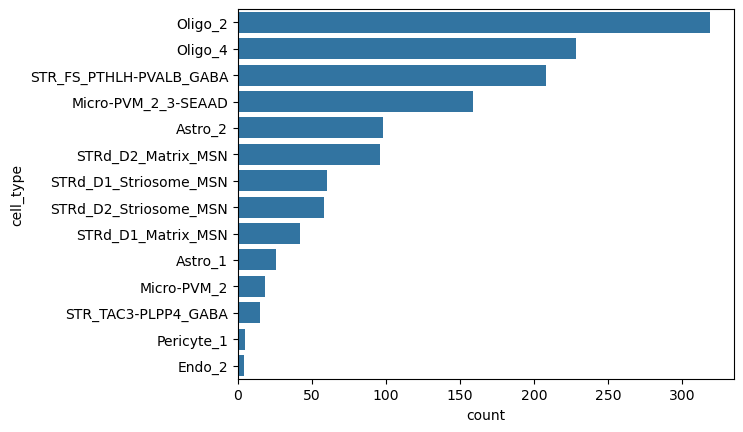

In [42]:
sns.barplot(significant_overlap_df['cell_type'].value_counts(), orient = "h")